In [95]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
import keras
import tensorflow as tf
import numpy as np
from numpy  import expand_dims
import cv2
from matplotlib import pyplot as plt
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
np.random.seed(15)
import matplotlib.pyplot as plt
import PIL

In [96]:
#케라스에서 제공하는 영상 불러오기
img = tf.keras.preprocessing.image.load_img('dog.jpg')  # 이미지 객체임
data = tf.keras.preprocessing.image.img_to_array(img)   # data 만 추출
print(data.shape)
sample = expand_dims(data,0)    # 차원 늘려주는 함수
print(sample.shape)#4차원으로 무조건 변경해서 넣어줘야 함

(338, 280, 3)
(1, 338, 280, 3)


In [97]:
# opencv 사용해 이미지 loaidng
data = cv2.imread('dog.jpg')
data = cv2.cvtColor(data, cv2.COLOR_BGR2RGB)
sample = expand_dims(data,0)
print(sample.shape)

(1, 338, 280, 3)


In [98]:
generator = tf.keras.preprocessing.image.ImageDataGenerator(    
    width_shift_range = 0.2) 
obj = generator.flow(sample, batch_size=1)   

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 338, 280, 3)
(338, 280, 3)


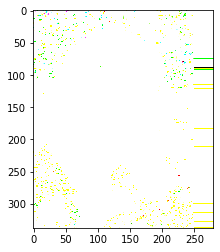

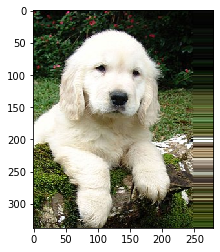

In [146]:
# 할때마다 다른 이미지 나온다.
image = obj.next()
print(image.shape)  # 
print(image[0].shape)
#print(image[0])

plt.imshow(image[0].astype('uint8') )  #  plt로 할때는 0~1사이로  혹은 타입을 uint8로 
plt.imshow(image[0])
plt.show()
plt.imshow(image[0]/255)  #  plt로 할때는 0~1사이로  혹은 타입을 uint8로 
plt.show()

In [6]:
generator = tf.keras.preprocessing.image.ImageDataGenerator(    
    width_shift_range = 0.2, rescale=1./255)   # rescale 해주면 정규화하고, imshow할때 type변한 필유없다. , 0에서 1로 값이 나온다
obj = generator.flow(sample, batch_size=1)   

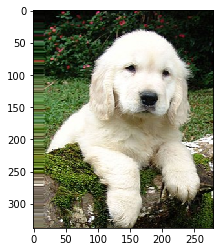

In [7]:
image = obj.next()
plt.imshow(image[0] )

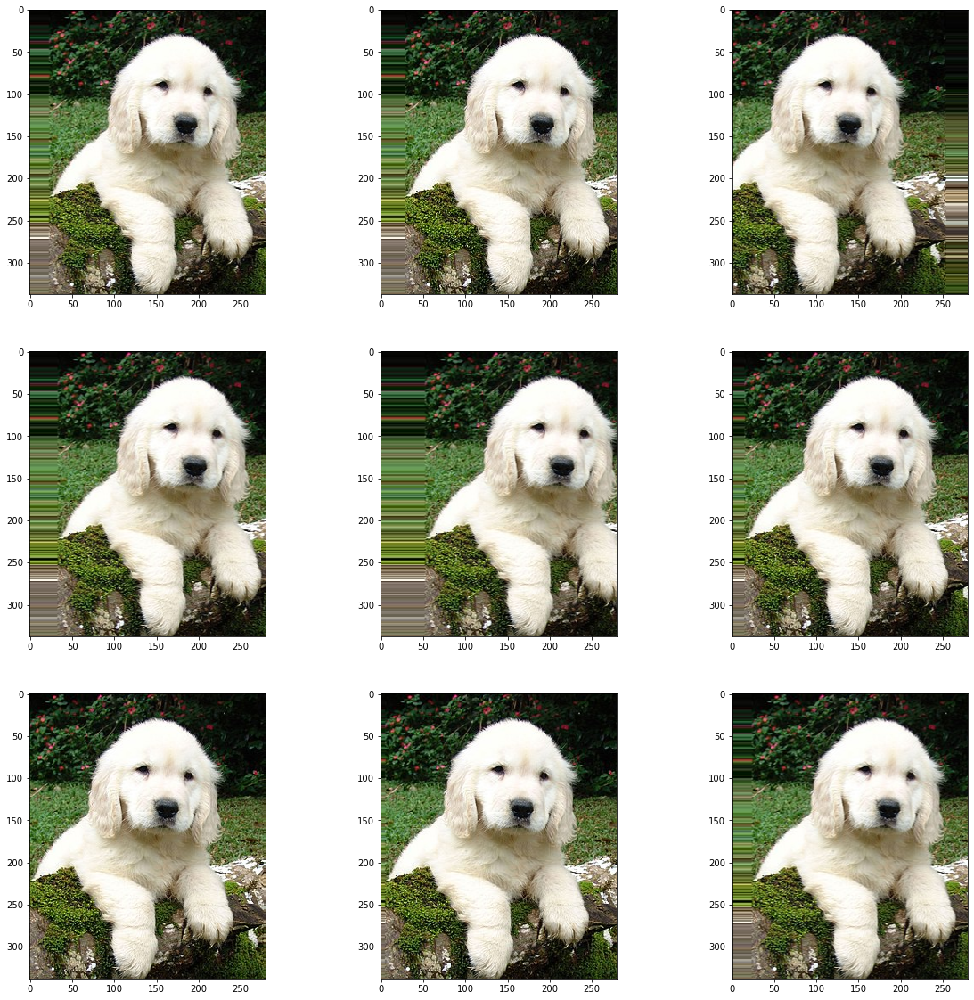

In [8]:
fig = plt.figure(figsize=(20,20))
for i in range(9) :
    plt.subplot(3,3,i+1)
    image = obj.next()
    plt.imshow(image[0])   

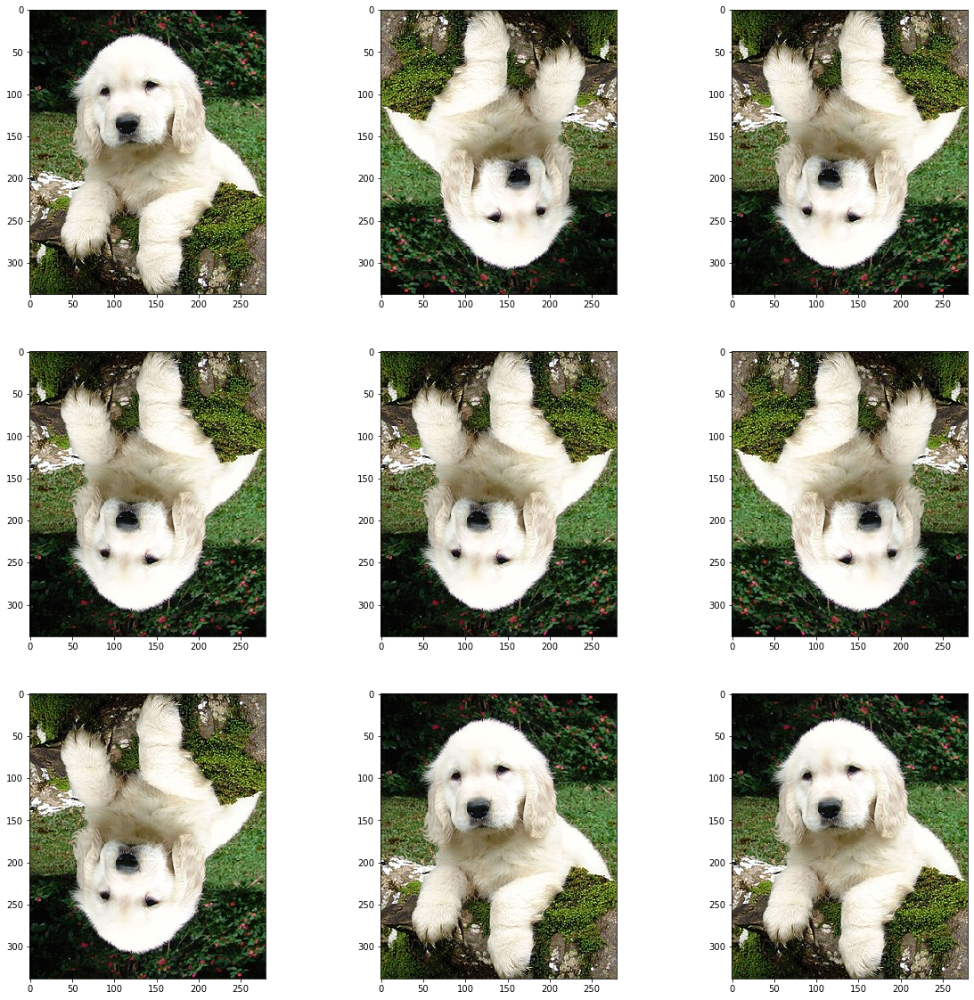

In [9]:
generator = tf.keras.preprocessing.image.ImageDataGenerator( 
    horizontal_flip = True, vertical_flip = True, # 수직 또는 수평으로 플립할건지
    rescale=1./255)
obj = generator.flow(sample, batch_size=1)   

fig = plt.figure(figsize=(20,20))
for i in range(9) :
    plt.subplot(3,3,i+1)
    image = obj.next()# 이미지가 다르게 나온다.
    plt.imshow(image[0])   

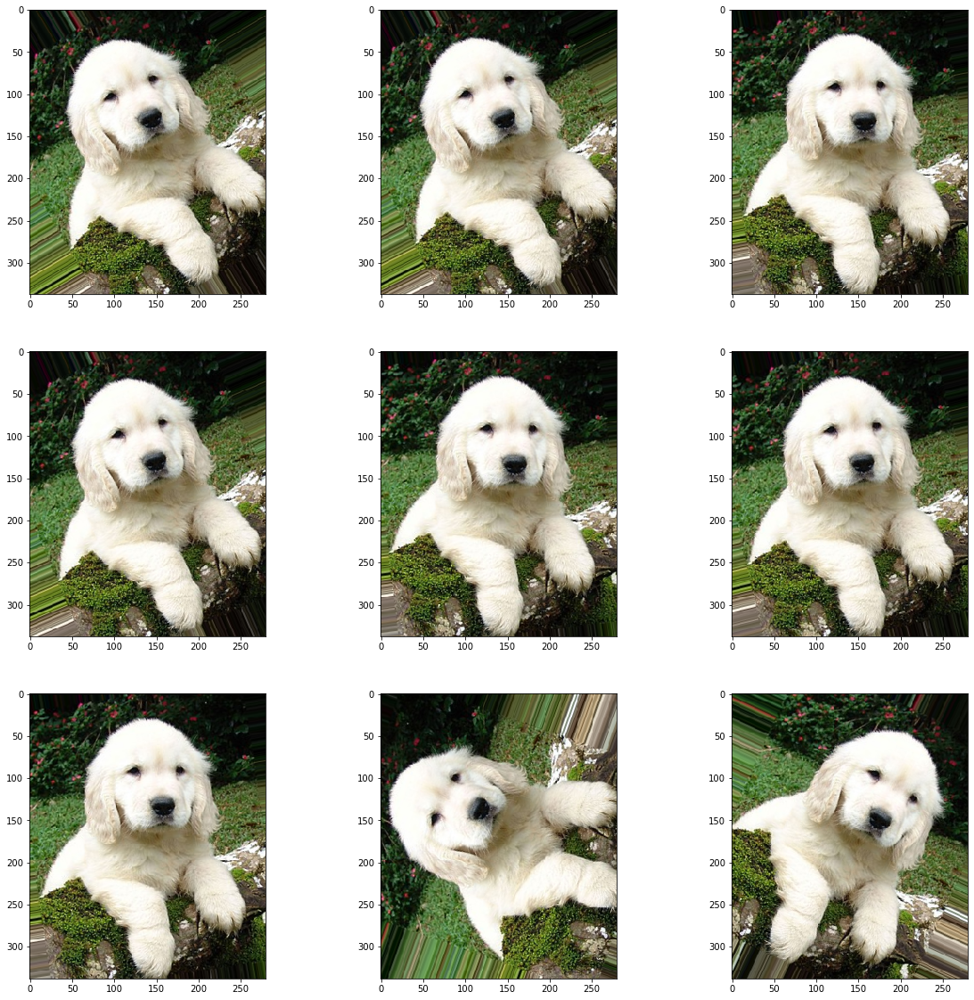

In [10]:
generator = tf.keras.preprocessing.image.ImageDataGenerator(  # +- 90도 내에서 회전, 빈공간은 마지막 값으로 지정 ? 
    rotation_range=90,
    rescale=1./255)
obj = generator.flow(sample, batch_size=1)   

fig = plt.figure(figsize=(20,20))
for i in range(9) :
    plt.subplot(3,3,i+1)
    image = obj.next() 
    plt.imshow(image[0])   
    

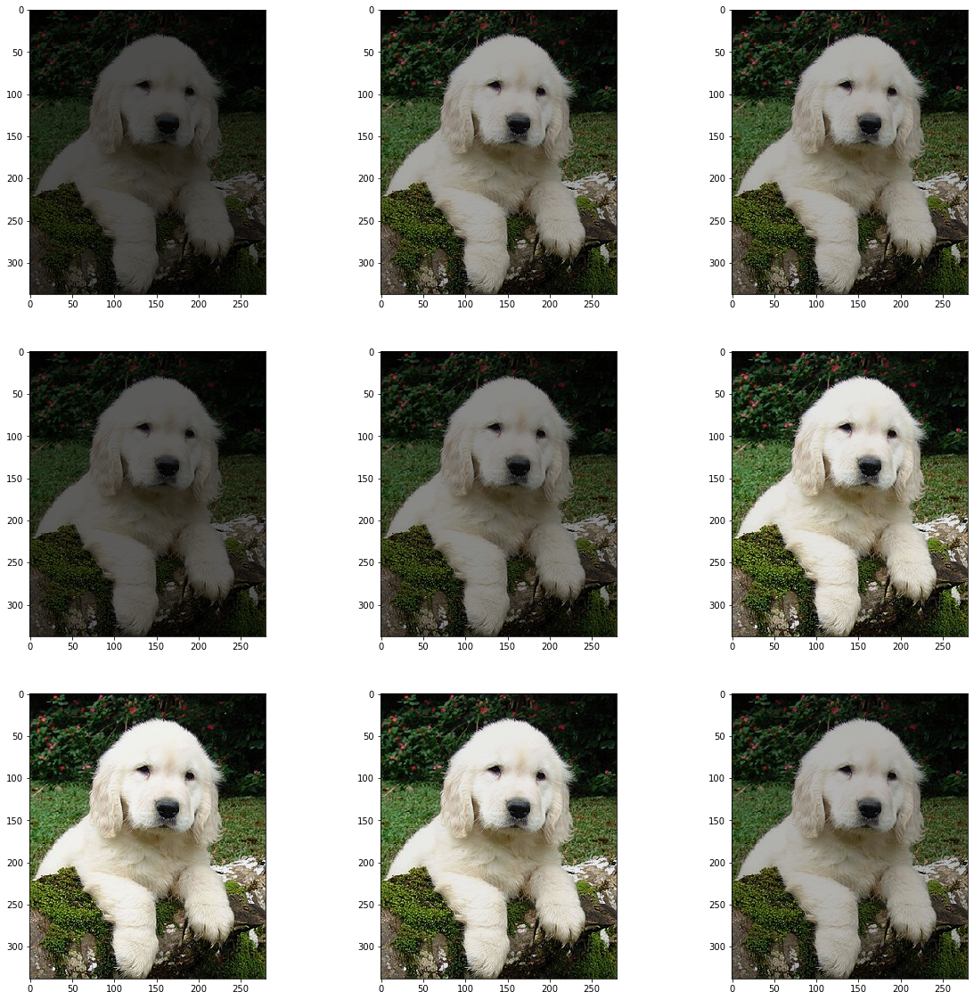

In [11]:
generator = tf.keras.preprocessing.image.ImageDataGenerator( # 어떤 기하학적인 병형을 적용할 것인지 .
    brightness_range=[0.2, 1.0],       
    rescale=1./255)
obj = generator.flow(sample, batch_size=1)  #샘플을 넣고 생성할 개 수, 영상이 생성됨

fig = plt.figure(figsize=(20,20))
for i in range(9) :
    plt.subplot(3,3,i+1)
    image = obj.next() #
    plt.imshow(image[0])   

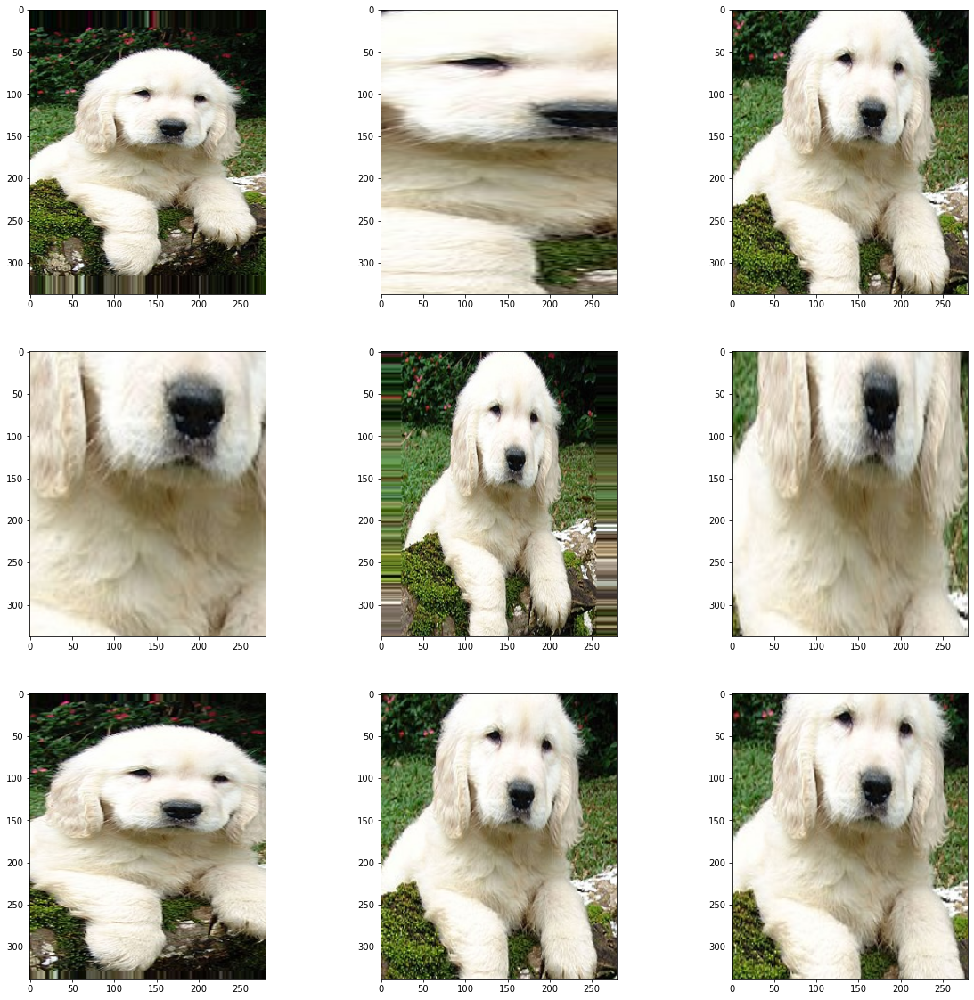

In [12]:
generator = tf.keras.preprocessing.image.ImageDataGenerator(  #축소할건지 확대 할건지
    zoom_range=[0.2, 1.2],   
    rescale=1./255)
obj = generator.flow(sample, batch_size=1)   

fig = plt.figure(figsize=(20,20))
for i in range(9) :
    plt.subplot(3,3,i+1)
    image = obj.next()
    plt.imshow(image[0])   

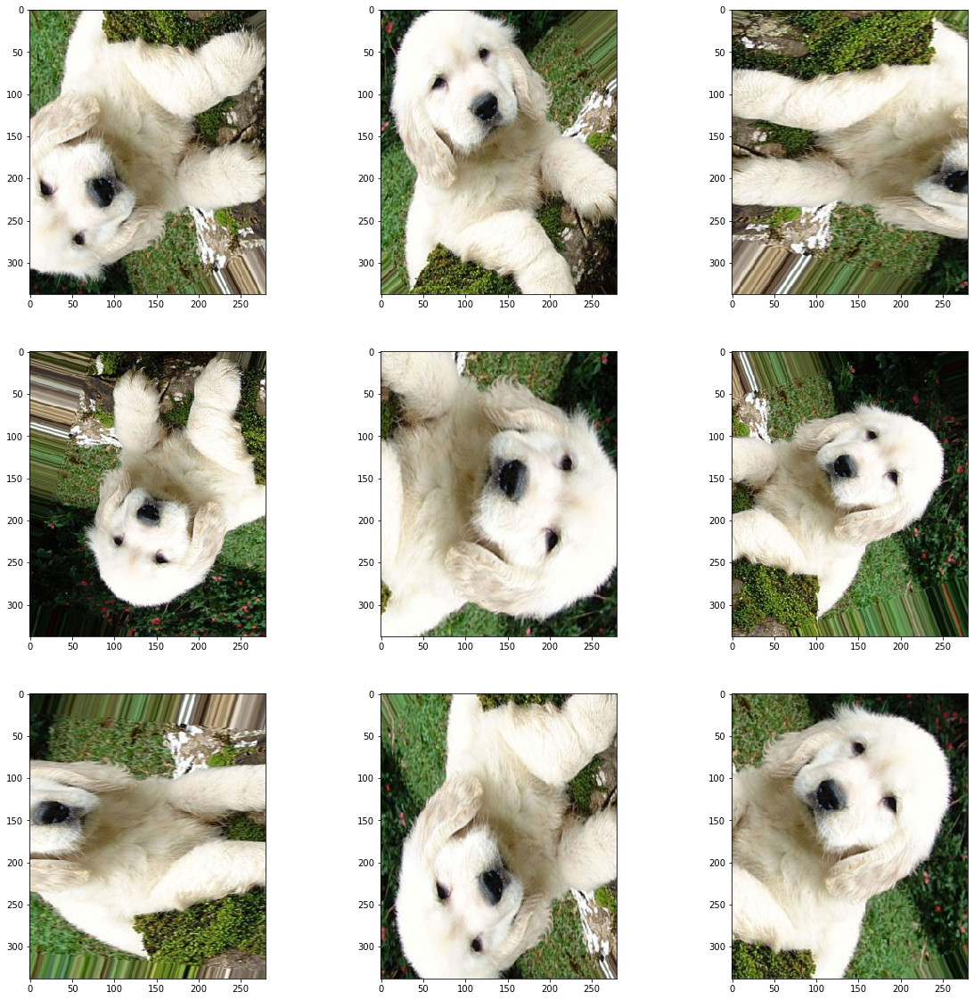

In [13]:
# 한꺼번에 적용하기(종합적인 기하학적 변형)
generator = tf.keras.preprocessing.image.ImageDataGenerator( 
    width_shift_range = 0.2,
    zoom_range=[0.5, 1.0],   
    horizontal_flip = True, vertical_flip = True,
    rotation_range=90,
    rescale=1./255)
obj = generator.flow(sample, batch_size=1)  # 배치사이즈는 데이터중에서 몇개를 사용할 건지... 딱히 상관없다..?

fig = plt.figure(figsize=(20,20))
for i in range(9) :
    plt.subplot(3,3,i+1)
    image = obj.next()
    plt.imshow(image[0])   

In [14]:
# 파일로 저장하기
obj = generator.flow(sample, batch_size=1, save_to_dir='dog_pic',  # 폴더는 미리 생성되어 있어야 함
    save_prefix="image", save_format="jpg")    

for i in range(0, 5):
    obj.next()    

In [28]:
# 2.  디렉토리로 부터 augmentation
#augsample/c1/2개 이미지
#augsample/c2/6개 이미지    
#augsample/c3/1개 이미지    

obj = generator.flow_from_directory(
    'data', #디렉토리 명
    target_size = (150, 150),   # 읽어드릴 이미지, 이미지 크기를 맞춰야 하기 때문에 생략시 256x256
    batch_size = 4,   # 8개 이미지 중에서 한번에 생성할 이미지 수 
    class_mode = 'categorical' )  # # binary(label) 벡터로 나옴  |  categorical(one-hot) 행렬로 나옴

#Found 75 images belonging to 3 classes. 
#75개의 이미지를 블러왔고  클래스 별로 3개의 폴더가 나뉨

Found 75 images belonging to 3 classes.


In [29]:
iterations = 2

for i, (img, label) in enumerate(obj): # 인덱스, 이미지, 레이블(위 배치사이즈 갯수만큼 가져옴), 레이블은 랜덤으로 가져옴
    n_img = len(label)    # 폴더에 있는 이미지 갯수 만큼 리턴한다.
    print(label)
    print(img.shape)
    if i is iterations - 1:
        break      
# 결과를 보면 lable은 1,1,1,0 처럼 꼭 c1과 c2에서 규일하게 생성되는것은 아니다.

[[1. 0. 0.]
 [0. 0. 1.]
 [0. 1. 0.]
 [0. 0. 1.]]
(4, 150, 150, 3)
[[0. 0. 1.]
 [0. 1. 0.]
 [0. 1. 0.]
 [0. 1. 0.]]
(4, 150, 150, 3)


In [34]:
# 저장하기
obj = generator.flow_from_directory(
    'data',
    target_size = (150, 150),   # 읽어드릴 이미지, 이미지 크기를 맞춰야 하기 때문에 생략시 256x256
    batch_size = 4,   # 8개 이미지 중에서 최대4개 만들어냄
    class_mode = 'binary',
    save_prefix="image", save_format="jpg",save_to_dir='images')

iterations = 2

for i, (img, label) in enumerate(obj):
    n_img = len(label)    # 폴더에 있는 이미지 갯수 만큼 리턴한다.
    print(label)
    print(img.shape)
    if i is iterations - 1:
        break
# aug 폴더하나에 8개이미지 출력됙다.  class별로 저정할수 없나?( 좀더 찾아바야함)

Found 75 images belonging to 3 classes.
[2. 2. 2. 1.]
(4, 150, 150, 3)
[1. 1. 2. 2.]
(4, 150, 150, 3)


#  2. 도형 

In [36]:
np.random.seed(5)


# 데이터셋 불러오기
data_aug_gen = ImageDataGenerator(rescale=1./255,  
                                  rotation_range=15,
                                  width_shift_range=0.1,
                                  height_shift_range=0.1,
                                  shear_range=0.5,
                                  zoom_range=[0.8, 2.0],
                                  horizontal_flip=True,
                                  vertical_flip=True,
                                  fill_mode='nearest') # 빈공간 생성시 근접한걸로 채워라
                                   
img = load_img('data/train/triangle/triangle001.png')
x = img_to_array(img)
x = x.reshape((1,) + x.shape)
i = 0

# 이 for는 무한으로 반복되기 때문에 우리가 원하는 반복횟수를 지정하여, 지정된 반복횟수가 되면 빠져나오도록 해야합니다.
# x는 트라이앵글 사진 하나
for batch in data_aug_gen.flow(x, batch_size=1, save_to_dir='images', save_prefix='tri', save_format='png'):
    i += 1
    if i > 30: 
        break
        

In [37]:
#트레인 데이터는 기하학적 변형을 취한다. 도형 문제를 풀 해결 코드이다
train_datagen = ImageDataGenerator(rescale=1./255, 
                                   rotation_range=10,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.7,
                                   zoom_range=[0.9, 2.2],
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   fill_mode='nearest')

train_generator = train_datagen.flow_from_directory(
        'data/train',
        target_size=(24, 24), #작은사이즈로 명시해봐라 #4차원으로 알아서 만들어 주기때문에 reshape 해줄 필요 없다
        batch_size=3, #3개씩 끄집어 내겠다
        class_mode='categorical') #원핫인코딩으로 


#테스트 데이터는 기하학적 변형을 취하지 않겠다.
test_datagen = ImageDataGenerator(rescale=1./255) #데이터를 0~ 255 를 0~1로 변형하겠다 

test_generator = test_datagen.flow_from_directory( #4차원으로 알아서 만들어 주기때문에 reshape 해줄 필요 없다
        'data/test',
        target_size=(24, 24),    
        batch_size=3,
        class_mode='categorical', shuffle=False)


#Found 45 images belonging to 3 classes. 트레인 데이터는 45개 읽음
#Found 15 images belonging to 3 classes. 테스트 데이터는 15개 읽음

Found 45 images belonging to 3 classes.
Found 15 images belonging to 3 classes.


In [42]:
model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=(24,24,3)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(3, activation='softmax'))

# 모델 엮기
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [44]:
# 모델 학습시키기
model.fit_generator( #train 데이터(가짜 데이터)를 만들면서 학습하기 때문에 fit_generator 를 쓴다
        train_generator,
        steps_per_epoch=15 * 100, # 생성할 총 갯수 에포크당 1500개
        epochs=20, #200 
        validation_data=test_generator,
        validation_steps=5) # 5번 돌때마다 벨리데이션 체크

Epoch 1/20
1500/1500 [==============================] - 15s 10ms/step - loss: 0.0194 - accuracy: 0.9936 - val_loss: 0.0000e+00 - val_accuracy: 0.7333
Epoch 2/20
1500/1500 [==============================] - 15s 10ms/step - loss: 0.0103 - accuracy: 0.9958 - val_loss: 3.9736e-08 - val_accuracy: 0.8667
Epoch 3/20
1500/1500 [==============================] - 15s 10ms/step - loss: 0.0156 - accuracy: 0.9967 - val_loss: 1.6070e-04 - val_accuracy: 0.8667
Epoch 4/20
1500/1500 [==============================] - 15s 10ms/step - loss: 0.0155 - accuracy: 0.9967 - val_loss: 1.5895e-06 - val_accuracy: 0.8667
Epoch 5/20
1500/1500 [==============================] - 15s 10ms/step - loss: 0.0117 - accuracy: 0.9969 - val_loss: 0.0788 - val_accuracy: 0.8000
Epoch 6/20
1500/1500 [==============================] - 15s 10ms/step - loss: 0.0086 - accuracy: 0.9976 - val_loss: 7.9473e-08 - val_accuracy: 0.8000
Epoch 7/20
1500/1500 [==============================] - 15s 10ms/step - loss: 0.0144 - accuracy: 0.9958 

In [46]:
# 모델 예측하기
print("-- Predict --")
output = model.predict_generator( test_generator,  steps = 5)    # batch 사이즈가 3 , 15개가 생성됨
print(output)

T = test_generator.classes
print(T)
p = np.argmax(output, axis=1)
print(p)

sum((T == p)*1) / len(T)

-- Predict --
[[7.31024384e-01 2.68868864e-01 1.06751395e-04]
 [5.37214197e-12 7.59822506e-05 9.99924064e-01]
 [9.93286312e-01 2.53225582e-14 6.71362737e-03]
 [1.00000000e+00 1.95862510e-12 3.19438624e-17]
 [1.00000000e+00 3.99167201e-12 5.78519767e-11]
 [2.97218468e-17 1.00000000e+00 4.58433725e-12]
 [2.53013385e-20 6.62652701e-02 9.33734715e-01]
 [3.71078033e-13 1.00000000e+00 2.54172829e-11]
 [6.95032606e-24 1.00000000e+00 1.43112225e-16]
 [1.10020663e-03 9.98899579e-01 2.29720115e-07]
 [1.77815817e-20 1.77571404e-13 1.00000000e+00]
 [5.09810233e-22 1.31116621e-13 1.00000000e+00]
 [7.20200344e-09 8.14903324e-05 9.99918461e-01]
 [2.97641608e-25 2.51488975e-24 1.00000000e+00]
 [2.08863116e-27 3.84672508e-21 1.00000000e+00]]
[0 0 0 0 0 1 1 1 1 1 2 2 2 2 2]
[0 2 0 0 0 1 2 1 1 1 2 2 2 2 2]


0.8666666666666667

In [45]:
# 모델 평가하기, 최종 결과 확인
scores = model.evaluate_generator( test_generator, steps = 5)
print(scores[1])

0.8666666746139526


### 성능 분석
- 무엇이 문제인지 분석해보자

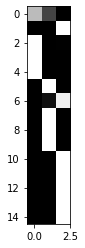

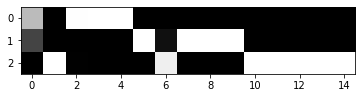

In [50]:
#이미지를 표시할때 자동으로 255를 곱해주면서 자동정규화 해줌
plt.imshow(output, cmap='gray')
plt.show()
plt.imshow(output.T, cmap='gray') # x는 샘플 수 , y는 클래스 수
plt.show()

#밝을수록 확률 값이 낮음

In [51]:
labels = ['c','r','t'] #원, 사각형, 삼각형

In [55]:
print(p)
y_ =  np.argmax(output, axis=1)
print(y_)

idx = np.where(  p != y_ )
print(idx)

[0 2 0 0 0 1 2 1 1 1 2 2 2 2 2]
[0 2 0 0 0 1 2 1 1 1 2 2 2 2 2]
(array([], dtype=int64),)


In [69]:
#데이터셋 호출(test)
test_x = np.zeros((15,24,24)) 
test_y = np.zeros(15)
for i in range (5):
    img2 = cv2.imread('./data/test/triangle/triangle{0:03d}.png'.format(i+21) ,  cv2.IMREAD_GRAYSCALE)
    test_x[i,:,:] = img2
    test_y[i] = 0
    
    img2 = cv2.imread('./data/test/rectangle/rectangle{0:03d}.png'.format(i+21) ,  cv2.IMREAD_GRAYSCALE)
    test_x[i+5,:,:] = img2
    test_y[i+5] = 1
    
    img2 = cv2.imread('./data/test/circle/circle{0:03d}.png'.format(i+21) ,  cv2.IMREAD_GRAYSCALE)
    test_x[i+10,:,:] = img2
    test_y[i+10] = 2

print(test_x.shape)
test_x = test_x.reshape((test_x.shape[0], test_x.shape[1], test_x.shape[2], 1))  # 갯수, w, h, 1

(15, 24, 24)


In [74]:
test_generator = test_datagen.flow_from_directory( #4차원으로 알아서 만들어 주기때문에 reshape 해줄 필요 없다
        'data/test',
        target_size=(24, 24),    
        batch_size=15, # 가져올 데이터 수 
        class_mode='categorical', shuffle=False)

a = test_generator.next()
print(a[0].shape)  # 이미지 반환
print(a[1].shape) # 레이블 반환

Found 15 images belonging to 3 classes.
(15, 24, 24, 3)
(15, 3)


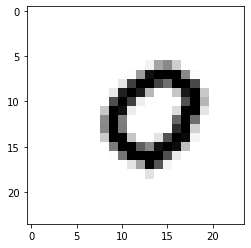

In [85]:
plt.imshow(a[0][2])

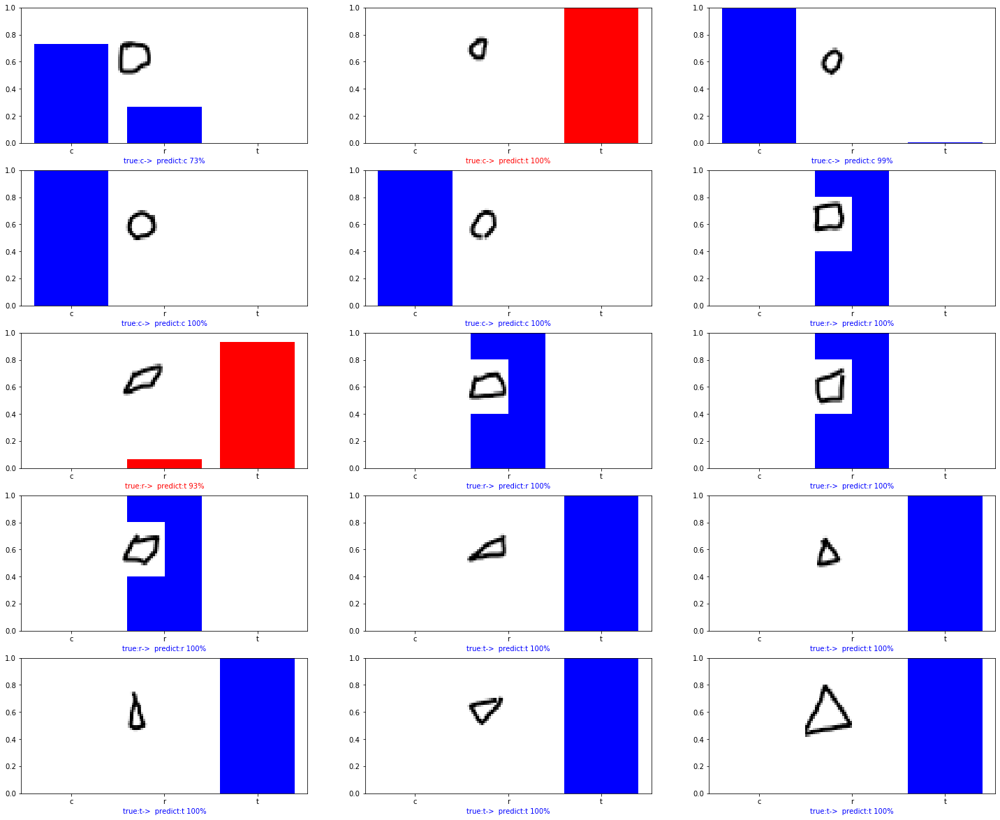

In [93]:
idx = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14]

plt.figure(figsize=(25, 25))

cc = 3
rr = int(len(idx) / cc)+1



for k in range( len(idx) ) :        
    i = idx[k]             
    c =  "blue" if  p[i] == T[i]   else "red"    
    plt.subplot( rr ,cc, k+1)
    plt.imshow(a[0][k], extent=[0.5, 1.0, 0.4, 0.8], aspect='auto', zorder=10, cmap="gray")
    plt.ylim(0.0, 1.0)
    plt.bar(labels, output[i], color=c)
    
    plt.xlabel("true:{}->  predict:{} {:2.0f}%".format(labels[int(T[i])], labels[p[i]],  100*np.max(output[i], axis=0)),  color = c )
    
#빨간색이 틀린거
#데이터 구분이 분명한거는 오버피팅이 될 확률이 높다는 얘기임
#분포가 고르게 되어있으면 정상임...